In [3]:
import numpy as np
import pandas as pd
import os
import sklearn
import matplotlib.pyplot as plt
%matplotlib inline
from sklearn.model_selection import train_test_split, StratifiedKFold
from sklearn.metrics import f1_score,accuracy_score

In [2]:
!pip install -qq tqdm

In [1]:
!pip -qq install simpletransformers

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 315.5/315.5 kB 6.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 536.7/536.7 kB 11.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 43.6/43.6 kB 5.6 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 101.7/101.7 kB 14.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.2/2.2 MB 15.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 8.4/8.4 MB 32.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 195.4/195.4 kB 22.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 258.5/258.5 kB 27.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 38.3/38.3 MB 14.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 116.3/116.3 kB 11.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 134.8/134.8 kB 13.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.8/4.8 MB 65.

In [4]:
!pip -qq install catboost xgboost

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 98.7/98.7 MB 8.7 MB/s eta 0:00:00


In [7]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [5]:
#model paths
mabert="/content/drive/MyDrive/Capstone/Models/Malayalam/mabert_malayalam.sav"
xlm="/content/drive/MyDrive/Capstone/Models/Malayalam/xlm_roberta_malayalam.sav"
distilbert="/content/drive/MyDrive/Capstone/Models/Malayalam/distilbert_malayalam.sav"
muril="/content/drive/MyDrive/Capstone/Models/Malayalam/muril_malayalam.sav"
mbert="/content/drive/MyDrive/Capstone/Models/Malayalam/mbert_malayalam.sav"

In [102]:
import pickle
mabert_model=pickle.load(open(mabert,'rb'))
#xlm_model=pickle.load(open(xlm,'rb'))
#mbert_model=pickle.load(open(mbert,'rb'))
#distilbert_model=pickle.load(open(distilbert,'rb'))
#muril_model=pickle.load(open(muril,'rb'))

In [6]:
colab_sample_data_path = '/content/sample_data'
os.chdir(colab_sample_data_path)

## Preprocessing the dataset (text to numerical feature vector)

In [9]:
from IPython.display import clear_output
from tqdm import tqdm
import pandas as pd

def preprocess_dataset(df, model, training, batch_size):
    processed_text, labels = [], []

    #n=df[df.columns[0]].count()

    #if training:
    #  df = df.head(int(n * 0.70))
    #else:
    #  df = df.tail(int(n * 0.30))

    # Use tqdm for a progress bar
    total_batches = (len(df) + batch_size - 1) // batch_size
    for i in tqdm(range(0, len(df), batch_size), total=total_batches, desc="Processing Data"):
        batch_texts = df['text'].iloc[i:i+batch_size].tolist()
        batch_labels = df['label'].iloc[i:i+batch_size].tolist()

        # Use batch processing for predictions
        batch_predictions = model.predict(batch_texts)
        processed_text.extend(batch_predictions[1])  # processed text
        labels.extend(batch_labels)

        clear_output(wait=True)

    return np.array(processed_text), np.array(labels)


In [131]:
dataset2=pd.read_csv("/content/drive/MyDrive/Capstone/Dataset/Preprocessed/malayalam_dataset_2_train.csv")
dataset2_filtered = dataset2[dataset2['label'] != 2]
X=list(dataset2_filtered['text'])
y=list(dataset2_filtered['label'])
X_train, X_test, y_train, y_test = train_test_split(X, y , random_state=42,test_size=0.3)
train_df = pd.DataFrame({"text": X_train, "label": y_train})
test_df = pd.DataFrame({"text": X_test, "label": y_test})

### MABERT Ensemble models for malayalam text

In [132]:
 #get the features vector and their labels (training set)
X_train,y_train=preprocess_dataset(train_df,
                                   model=mabert_model,
                                   training=True,
                                   batch_size=128)

Processing Data: 100%|██████████| 101/101 [02:37<00:00,  1.56s/it]


In [133]:
#get the features vector and their labels (testing set)
X_test,y_test=preprocess_dataset(test_df,
                                 model=mabert_model,
                                 training=False,
                                 batch_size=128)

Processing Data: 100%|██████████| 44/44 [01:07<00:00,  1.54s/it]


#### SVM

In [134]:
from sklearn.svm import SVC
from sklearn.metrics import classification_report, confusion_matrix
svm_classifier = SVC(kernel='rbf', random_state=42)
svm_classifier.fit(X_train, y_train)
pred_svm = svm_classifier.predict(X_test)
print(classification_report(y_test, pred_svm,zero_division=1))
print(confusion_matrix(y_test, pred_svm))

              precision    recall  f1-score   support

           0       0.96      1.00      0.98      5293
           1       1.00      0.00      0.00       228

    accuracy                           0.96      5521
   macro avg       0.98      0.50      0.49      5521
weighted avg       0.96      0.96      0.94      5521

[[5293    0]
 [ 228    0]]


#### Decision tree

In [135]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import classification_report,confusion_matrix
clf=DecisionTreeClassifier(criterion='entropy',random_state=42)
clf.fit(X_train,y_train)
pred_dtc=clf.predict(X_test)
print(classification_report(pred_dtc,y_test))
print(confusion_matrix(pred_dtc,y_test))

              precision    recall  f1-score   support

           0       0.98      0.97      0.97      5308
           1       0.38      0.40      0.39       213

    accuracy                           0.95      5521
   macro avg       0.68      0.69      0.68      5521
weighted avg       0.95      0.95      0.95      5521

[[5166  142]
 [ 127   86]]


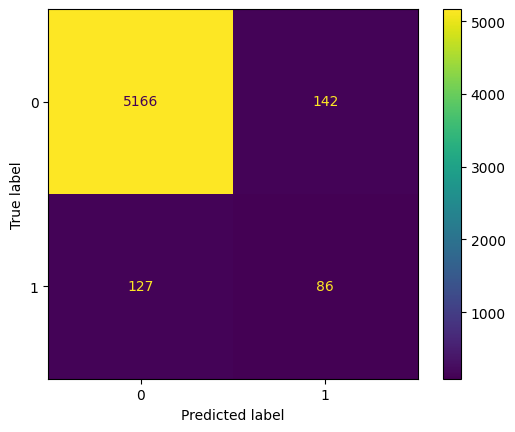

In [136]:
from sklearn.metrics import ConfusionMatrixDisplay
fig=ConfusionMatrixDisplay(confusion_matrix=confusion_matrix(pred_dtc,y_test),display_labels=clf.classes_)
fig.plot()

#### Random forest

In [137]:
from sklearn.ensemble import RandomForestClassifier
rfc = RandomForestClassifier(n_estimators=10,criterion='entropy',random_state=42)
rfc.fit(X_train,y_train)
pred_rfc = rfc.predict(X_test)
print(classification_report(y_test,pred_rfc))
print(confusion_matrix(y_test,pred_rfc))

              precision    recall  f1-score   support

           0       0.97      1.00      0.98      5293
           1       0.75      0.31      0.44       228

    accuracy                           0.97      5521
   macro avg       0.86      0.65      0.71      5521
weighted avg       0.96      0.97      0.96      5521

[[5270   23]
 [ 158   70]]


In [138]:
#find the best tree value
error_rate = []

for i in range(1,40):
    rfc = RandomForestClassifier(n_estimators=i,criterion='entropy',random_state=42)
    rfc.fit(X_train,y_train)
    pred_i = rfc.predict(X_test)
    error_rate.append(np.mean(pred_i != y_test))

Text(0, 0.5, 'Error Rate')

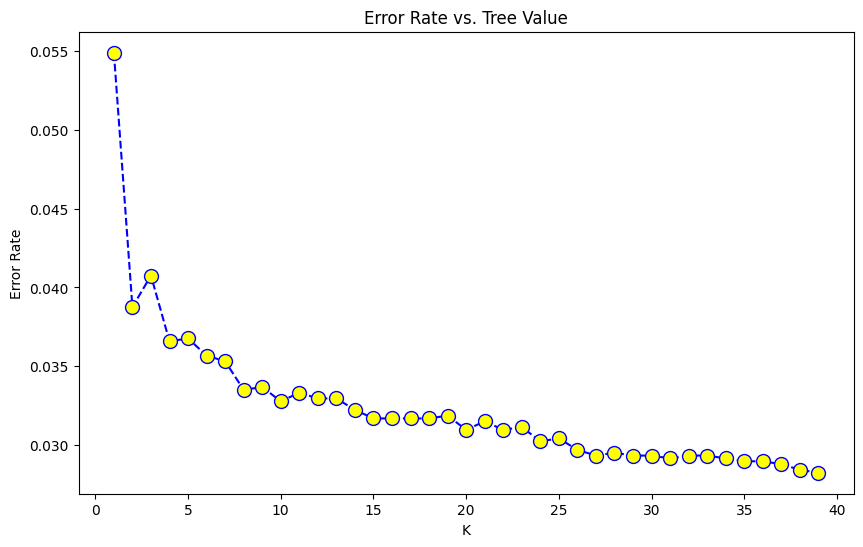

In [139]:
import seaborn as sns
import matplotlib.pyplot as plt

plt.figure(figsize=(10,6))
plt.plot(range(1,40),error_rate,color='blue', linestyle='dashed', marker='o',
         markerfacecolor='yellow', markersize=10)
plt.title('Error Rate vs. Tree Value')
plt.xlabel('K')
plt.ylabel('Error Rate') #error rate decrease as the tree value increases

In [140]:
rfc = RandomForestClassifier(n_estimators=5,criterion='entropy',random_state=42) #12- trees from elbow method
rfc.fit(X_train,y_train)
pred_rfc= rfc.predict(X_test)
print(classification_report(y_test,pred_rfc))
print(confusion_matrix(y_test,pred_rfc))

              precision    recall  f1-score   support

           0       0.97      0.99      0.98      5293
           1       0.62      0.29      0.39       228

    accuracy                           0.96      5521
   macro avg       0.79      0.64      0.69      5521
weighted avg       0.96      0.96      0.96      5521

[[5252   41]
 [ 162   66]]


#### Xgboost classifier

In [141]:
from xgboost import XGBClassifier
classifier=XGBClassifier()
classifier.fit(X_train,y_train)
pred_xgb= classifier.predict(X_test)
print(classification_report(y_test,pred_rfc))
print(confusion_matrix(y_test,pred_rfc))

              precision    recall  f1-score   support

           0       0.97      0.99      0.98      5293
           1       0.62      0.29      0.39       228

    accuracy                           0.96      5521
   macro avg       0.79      0.64      0.69      5521
weighted avg       0.96      0.96      0.96      5521

[[5252   41]
 [ 162   66]]


In [142]:
from xgboost import XGBClassifier
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import classification_report, confusion_matrix

# Define the XGBoost classifier
classifier = XGBClassifier()

# Define the parameter grid for hyperparameter tuning
param_grid = {
    'n_estimators': [100, 200, 300],
    'max_depth': [3, 5, 7],
    'learning_rate': [0.01, 0.05, 0.1]
}

# Perform grid search cross-validation
grid_search = GridSearchCV(estimator=classifier, param_grid=param_grid, cv=3, scoring='accuracy', verbose=2, n_jobs=-1)

# Fit the grid search to the data
grid_search.fit(X_train, y_train)

# Get the best model
best_classifier = grid_search.best_estimator_

# Make predictions with the best model
pred_xgb = best_classifier.predict(X_test)

# Print classification report and confusion matrix
print("Classification Report:")
print(classification_report(y_test, pred_xgb,zero_division=1))
print("Confusion Matrix:")
print(confusion_matrix(y_test, pred_xgb))

# Print the best parameters found
print("Best Parameters:", grid_search.best_params_)


Fitting 3 folds for each of 27 candidates, totalling 81 fits
Classification Report:
              precision    recall  f1-score   support

           0       0.96      1.00      0.98      5293
           1       1.00      0.00      0.00       228

    accuracy                           0.96      5521
   macro avg       0.98      0.50      0.49      5521
weighted avg       0.96      0.96      0.94      5521

Confusion Matrix:
[[5293    0]
 [ 228    0]]
Best Parameters: {'learning_rate': 0.01, 'max_depth': 3, 'n_estimators': 100}


#### Catboost classifier

In [143]:
from catboost import CatBoostClassifier
classifier=CatBoostClassifier()
classifier.fit(X_train,y_train)
pred_xgb= classifier.predict(X_test)
print(classification_report(y_test,pred_rfc))
print(confusion_matrix(y_test,pred_rfc))

Learning rate set to 0.030683
0:	learn: 0.6466357	total: 4.84ms	remaining: 4.84s
1:	learn: 0.6043705	total: 10.2ms	remaining: 5.1s
2:	learn: 0.5654699	total: 14.6ms	remaining: 4.84s
3:	learn: 0.5302732	total: 17.7ms	remaining: 4.41s
4:	learn: 0.4981886	total: 21.5ms	remaining: 4.27s
5:	learn: 0.4689806	total: 25.7ms	remaining: 4.25s
6:	learn: 0.4424316	total: 29.6ms	remaining: 4.2s
7:	learn: 0.4180553	total: 33.5ms	remaining: 4.15s
8:	learn: 0.3959352	total: 37.3ms	remaining: 4.11s
9:	learn: 0.3757695	total: 41.2ms	remaining: 4.08s
10:	learn: 0.3574077	total: 45.8ms	remaining: 4.12s
11:	learn: 0.3406527	total: 49.5ms	remaining: 4.07s
12:	learn: 0.3253700	total: 53.5ms	remaining: 4.06s
13:	learn: 0.3114075	total: 57.1ms	remaining: 4.02s
14:	learn: 0.2987210	total: 60.9ms	remaining: 4s
15:	learn: 0.2870568	total: 64.8ms	remaining: 3.98s
16:	learn: 0.2765457	total: 68.1ms	remaining: 3.94s
17:	learn: 0.2669116	total: 73.6ms	remaining: 4.01s
18:	learn: 0.2580633	total: 77.4ms	remaining: 3.9

In [144]:
from catboost import CatBoostClassifier
from sklearn.model_selection import GridSearchCV, StratifiedKFold
from sklearn.metrics import classification_report, confusion_matrix

# Define the CatBoost classifier
classifier = CatBoostClassifier()

# Define the parameter grid for hyperparameter tuning
param_grid = {
    'iterations': [100, 200],
    'depth': [3, 5],
    'learning_rate': [0.05, 0.1]
}

# Define stratified k-fold cross-validation
cv = StratifiedKFold(n_splits=3, shuffle=True, random_state=42)

# Perform grid search cross-validation with early stopping
grid_search = GridSearchCV(estimator=classifier, param_grid=param_grid, cv=cv, scoring='accuracy', verbose=2, n_jobs=-1)

# Fit the grid search to the data with early stopping
grid_search.fit(X_train, y_train, early_stopping_rounds=10, eval_set=(X_test, y_test), verbose=False)

# Get the best model
best_classifier = grid_search.best_estimator_

# Make predictions with the best model
pred_catboost = best_classifier.predict(X_test)

# Print classification report and confusion matrix
print("Classification Report:")
print(classification_report(y_test, pred_catboost,zero_division=1))
print("Confusion Matrix:")
print(confusion_matrix(y_test, pred_catboost))

# Print the best parameters found
print("Best Parameters:", grid_search.best_params_)


Fitting 3 folds for each of 8 candidates, totalling 24 fits
Classification Report:
              precision    recall  f1-score   support

           0       0.96      1.00      0.98      5293
           1       1.00      0.00      0.00       228

    accuracy                           0.96      5521
   macro avg       0.98      0.50      0.49      5521
weighted avg       0.96      0.96      0.94      5521

Confusion Matrix:
[[5293    0]
 [ 228    0]]
Best Parameters: {'depth': 3, 'iterations': 100, 'learning_rate': 0.05}


### XLM_RoBERTa Ensemble models for malayalam text

In [117]:
 #get the features vector and their labels (training set)
X_train,y_train=preprocess_dataset(train_df,
                                   model=xlm_model,
                                   training=True,
                                   batch_size=128)

Processing Data: 100%|██████████| 101/101 [04:14<00:00,  2.52s/it]


In [118]:
#get the features vector and their labels (testing set)
X_test,y_test=preprocess_dataset(test_df,
                                 model=xlm_model,
                                 training=False,
                                 batch_size=128)

Processing Data: 100%|██████████| 44/44 [01:44<00:00,  2.37s/it]


#### SVM

In [119]:
from sklearn.svm import SVC
from sklearn.metrics import classification_report, confusion_matrix
svm_classifier = SVC(kernel='rbf', random_state=42)
svm_classifier.fit(X_train, y_train)
pred_svm = svm_classifier.predict(X_test)
print(classification_report(y_test, pred_svm))
print(confusion_matrix(y_test, pred_svm))

              precision    recall  f1-score   support

           0       0.98      0.99      0.99      5293
           1       0.80      0.57      0.67       228

    accuracy                           0.98      5521
   macro avg       0.89      0.78      0.83      5521
weighted avg       0.97      0.98      0.97      5521

[[5261   32]
 [  97  131]]


#### Decision tree

In [120]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import classification_report,confusion_matrix
clf=DecisionTreeClassifier(criterion='entropy',random_state=42)
clf.fit(X_train,y_train)
pred_dtc=clf.predict(X_test)
print(classification_report(pred_dtc,y_test))
print(confusion_matrix(pred_dtc,y_test))

              precision    recall  f1-score   support

           0       0.99      0.98      0.99      5352
           1       0.58      0.79      0.67       169

    accuracy                           0.98      5521
   macro avg       0.79      0.88      0.83      5521
weighted avg       0.98      0.98      0.98      5521

[[5257   95]
 [  36  133]]


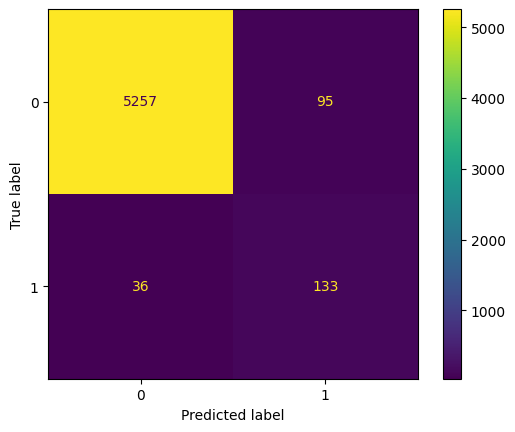

In [121]:
from sklearn.metrics import ConfusionMatrixDisplay
fig=ConfusionMatrixDisplay(confusion_matrix=confusion_matrix(pred_dtc,y_test),display_labels=clf.classes_)
fig.plot()

#### Random forest

In [122]:
from sklearn.ensemble import RandomForestClassifier
rfc = RandomForestClassifier(n_estimators=10,criterion='entropy',random_state=42)
rfc.fit(X_train,y_train)
pred_rfc = rfc.predict(X_test)
print(classification_report(y_test,pred_rfc))
print(confusion_matrix(y_test,pred_rfc))

              precision    recall  f1-score   support

           0       0.98      1.00      0.99      5293
           1       0.84      0.57      0.68       228

    accuracy                           0.98      5521
   macro avg       0.91      0.78      0.84      5521
weighted avg       0.98      0.98      0.98      5521

[[5268   25]
 [  97  131]]


In [123]:
#find the best tree value
error_rate = []

for i in range(1,40):
    rfc = RandomForestClassifier(n_estimators=i,criterion='entropy',random_state=42)
    rfc.fit(X_train,y_train)
    pred_i = rfc.predict(X_test)
    error_rate.append(np.mean(pred_i != y_test))

Text(0, 0.5, 'Error Rate')

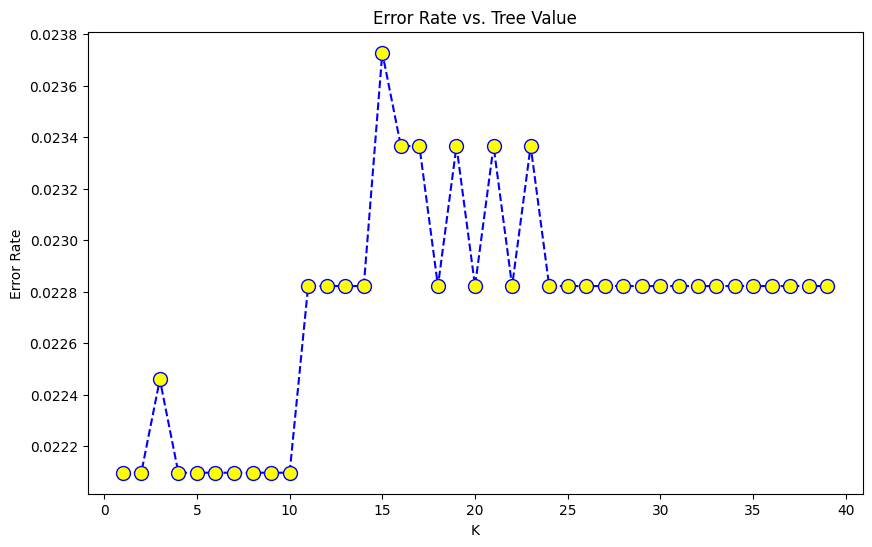

In [124]:
import seaborn as sns
import matplotlib.pyplot as plt

plt.figure(figsize=(10,6))
plt.plot(range(1,40),error_rate,color='blue', linestyle='dashed', marker='o',
         markerfacecolor='yellow', markersize=10)
plt.title('Error Rate vs. Tree Value')
plt.xlabel('K')
plt.ylabel('Error Rate') #error rate decrease as the tree value increases

In [125]:
rfc = RandomForestClassifier(n_estimators=5,criterion='entropy',random_state=42) #12- trees from elbow method
rfc.fit(X_train,y_train)
pred_rfc= rfc.predict(X_test)
print(classification_report(y_test,pred_rfc))
print(confusion_matrix(y_test,pred_rfc))

              precision    recall  f1-score   support

           0       0.98      1.00      0.99      5293
           1       0.84      0.57      0.68       228

    accuracy                           0.98      5521
   macro avg       0.91      0.78      0.84      5521
weighted avg       0.98      0.98      0.98      5521

[[5268   25]
 [  97  131]]


#### Xgboost classifier

In [126]:
from xgboost import XGBClassifier
classifier=XGBClassifier()
classifier.fit(X_train,y_train)
pred_xgb= classifier.predict(X_test)
print(classification_report(y_test,pred_rfc))
print(confusion_matrix(y_test,pred_rfc))

              precision    recall  f1-score   support

           0       0.98      1.00      0.99      5293
           1       0.84      0.57      0.68       228

    accuracy                           0.98      5521
   macro avg       0.91      0.78      0.84      5521
weighted avg       0.98      0.98      0.98      5521

[[5268   25]
 [  97  131]]


In [127]:
from xgboost import XGBClassifier
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import classification_report, confusion_matrix

# Define the XGBoost classifier
classifier = XGBClassifier()

# Define the parameter grid for hyperparameter tuning
param_grid = {
    'n_estimators': [100, 200, 300],
    'max_depth': [3, 5, 7],
    'learning_rate': [0.01, 0.05, 0.1]
}

# Perform grid search cross-validation
grid_search = GridSearchCV(estimator=classifier, param_grid=param_grid, cv=3, scoring='accuracy', verbose=2, n_jobs=-1)

# Fit the grid search to the data
grid_search.fit(X_train, y_train)

# Get the best model
best_classifier = grid_search.best_estimator_

# Make predictions with the best model
pred_xgb = best_classifier.predict(X_test)

# Print classification report and confusion matrix
print("Classification Report:")
print(classification_report(y_test, pred_xgb))
print("Confusion Matrix:")
print(confusion_matrix(y_test, pred_xgb))

# Print the best parameters found
print("Best Parameters:", grid_search.best_params_)


Fitting 3 folds for each of 27 candidates, totalling 81 fits
Classification Report:
              precision    recall  f1-score   support

           0       0.98      1.00      0.99      5293
           1       0.91      0.48      0.63       228

    accuracy                           0.98      5521
   macro avg       0.94      0.74      0.81      5521
weighted avg       0.98      0.98      0.97      5521

Confusion Matrix:
[[5282   11]
 [ 119  109]]
Best Parameters: {'learning_rate': 0.01, 'max_depth': 3, 'n_estimators': 100}


#### Catboost classifier

In [128]:
from catboost import CatBoostClassifier
classifier=CatBoostClassifier()
classifier.fit(X_train,y_train)
pred_xgb= classifier.predict(X_test)
print(classification_report(y_test,pred_rfc))
print(confusion_matrix(y_test,pred_rfc))

Learning rate set to 0.030683
0:	learn: 0.5790290	total: 5.03ms	remaining: 5.02s
1:	learn: 0.4861212	total: 9.32ms	remaining: 4.65s
2:	learn: 0.4054168	total: 13.3ms	remaining: 4.41s
3:	learn: 0.3382719	total: 17.4ms	remaining: 4.32s
4:	learn: 0.2921141	total: 21.2ms	remaining: 4.21s
5:	learn: 0.2454478	total: 25.1ms	remaining: 4.16s
6:	learn: 0.2075374	total: 28.8ms	remaining: 4.08s
7:	learn: 0.1807796	total: 32.5ms	remaining: 4.03s
8:	learn: 0.1537496	total: 36.3ms	remaining: 4s
9:	learn: 0.1301726	total: 40.1ms	remaining: 3.97s
10:	learn: 0.1121295	total: 43.7ms	remaining: 3.93s
11:	learn: 0.0960446	total: 47.4ms	remaining: 3.9s
12:	learn: 0.0841359	total: 51ms	remaining: 3.87s
13:	learn: 0.0738490	total: 54.9ms	remaining: 3.86s
14:	learn: 0.0640985	total: 58.9ms	remaining: 3.87s
15:	learn: 0.0550135	total: 62.5ms	remaining: 3.85s
16:	learn: 0.0484062	total: 65.9ms	remaining: 3.81s
17:	learn: 0.0422402	total: 69.5ms	remaining: 3.79s
18:	learn: 0.0379831	total: 73.3ms	remaining: 3.78

In [129]:
from catboost import CatBoostClassifier
from sklearn.model_selection import GridSearchCV, StratifiedKFold
from sklearn.metrics import classification_report, confusion_matrix

# Define the CatBoost classifier
classifier = CatBoostClassifier()

# Define the parameter grid for hyperparameter tuning
param_grid = {
    'iterations': [100, 200],
    'depth': [3, 5],
    'learning_rate': [0.05, 0.1]
}

# Define stratified k-fold cross-validation
cv = StratifiedKFold(n_splits=3, shuffle=True, random_state=42)

# Perform grid search cross-validation with early stopping
grid_search = GridSearchCV(estimator=classifier, param_grid=param_grid, cv=cv, scoring='accuracy', verbose=2, n_jobs=-1)

# Fit the grid search to the data with early stopping
grid_search.fit(X_train, y_train, early_stopping_rounds=10, eval_set=(X_test, y_test), verbose=False)

# Get the best model
best_classifier = grid_search.best_estimator_

# Make predictions with the best model
pred_catboost = best_classifier.predict(X_test)

# Print classification report and confusion matrix
print("Classification Report:")
print(classification_report(y_test, pred_catboost))
print("Confusion Matrix:")
print(confusion_matrix(y_test, pred_catboost))

# Print the best parameters found
print("Best Parameters:", grid_search.best_params_)


Fitting 3 folds for each of 8 candidates, totalling 24 fits
Classification Report:
              precision    recall  f1-score   support

           0       0.98      1.00      0.99      5293
           1       0.91      0.48      0.63       228

    accuracy                           0.98      5521
   macro avg       0.94      0.74      0.81      5521
weighted avg       0.98      0.98      0.97      5521

Confusion Matrix:
[[5282   11]
 [ 118  110]]
Best Parameters: {'depth': 3, 'iterations': 100, 'learning_rate': 0.05}


### DistilBERT Ensemble models for malayalam text

In [46]:
 #get the features vector and their labels (training set)
X_train,y_train=preprocess_dataset(train_df,
                                   model=distilbert_model,
                                   training=True,
                                   batch_size=128)

Processing Data: 100%|██████████| 101/101 [02:21<00:00,  1.40s/it]


In [47]:
#get the features vector and their labels (testing set)
X_test,y_test=preprocess_dataset(test_df,
                                 model=distilbert_model,
                                 training=False,
                                 batch_size=128)

Processing Data: 100%|██████████| 44/44 [01:00<00:00,  1.37s/it]


#### SVM

In [48]:
from sklearn.svm import SVC
from sklearn.metrics import classification_report, confusion_matrix
svm_classifier = SVC(kernel='rbf', random_state=42)
svm_classifier.fit(X_train, y_train)
pred_svm = svm_classifier.predict(X_test)
print(classification_report(y_test, pred_svm))
print(confusion_matrix(y_test, pred_svm))

              precision    recall  f1-score   support

           0       0.98      0.99      0.99      5293
           1       0.76      0.51      0.61       228

    accuracy                           0.97      5521
   macro avg       0.87      0.75      0.80      5521
weighted avg       0.97      0.97      0.97      5521

[[5256   37]
 [ 112  116]]


#### Decision tree

In [49]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import classification_report,confusion_matrix
clf=DecisionTreeClassifier(criterion='entropy',random_state=42)
clf.fit(X_train,y_train)
pred_dtc=clf.predict(X_test)
print(classification_report(pred_dtc,y_test))
print(confusion_matrix(pred_dtc,y_test))

              precision    recall  f1-score   support

           0       0.99      0.98      0.99      5342
           1       0.56      0.71      0.62       179

    accuracy                           0.97      5521
   macro avg       0.77      0.85      0.80      5521
weighted avg       0.98      0.97      0.97      5521

[[5241  101]
 [  52  127]]


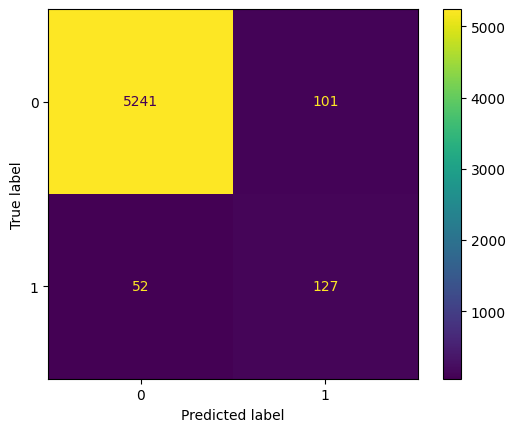

In [50]:
from sklearn.metrics import ConfusionMatrixDisplay
fig=ConfusionMatrixDisplay(confusion_matrix=confusion_matrix(pred_dtc,y_test),display_labels=clf.classes_)
fig.plot()

#### Random forest

In [51]:
from sklearn.ensemble import RandomForestClassifier
rfc = RandomForestClassifier(n_estimators=10,criterion='entropy',random_state=42)
rfc.fit(X_train,y_train)
pred_rfc = rfc.predict(X_test)
print(classification_report(y_test,pred_rfc))
print(confusion_matrix(y_test,pred_rfc))

              precision    recall  f1-score   support

           0       0.98      0.99      0.99      5293
           1       0.73      0.55      0.63       228

    accuracy                           0.97      5521
   macro avg       0.85      0.77      0.81      5521
weighted avg       0.97      0.97      0.97      5521

[[5246   47]
 [ 102  126]]


In [52]:
#find the best tree value
error_rate = []

for i in range(1,40):
    rfc = RandomForestClassifier(n_estimators=i,criterion='entropy',random_state=42)
    rfc.fit(X_train,y_train)
    pred_i = rfc.predict(X_test)
    error_rate.append(np.mean(pred_i != y_test))

Text(0, 0.5, 'Error Rate')

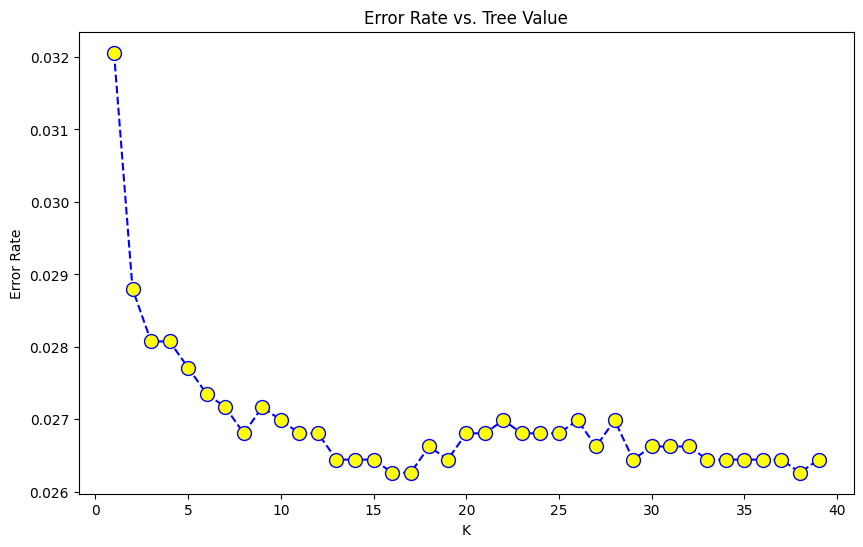

In [53]:
import seaborn as sns
import matplotlib.pyplot as plt

plt.figure(figsize=(10,6))
plt.plot(range(1,40),error_rate,color='blue', linestyle='dashed', marker='o',
         markerfacecolor='yellow', markersize=10)
plt.title('Error Rate vs. Tree Value')
plt.xlabel('K')
plt.ylabel('Error Rate') #error rate decrease as the tree value increases

In [54]:
rfc = RandomForestClassifier(n_estimators=5,criterion='entropy',random_state=42) #12- trees from elbow method
rfc.fit(X_train,y_train)
pred_rfc= rfc.predict(X_test)
print(classification_report(y_test,pred_rfc))
print(confusion_matrix(y_test,pred_rfc))

              precision    recall  f1-score   support

           0       0.98      0.99      0.99      5293
           1       0.71      0.56      0.62       228

    accuracy                           0.97      5521
   macro avg       0.85      0.77      0.80      5521
weighted avg       0.97      0.97      0.97      5521

[[5241   52]
 [ 101  127]]


#### Xgboost classifier

In [55]:
from xgboost import XGBClassifier
classifier=XGBClassifier()
classifier.fit(X_train,y_train)
pred_xgb= classifier.predict(X_test)
print(classification_report(y_test,pred_rfc))
print(confusion_matrix(y_test,pred_rfc))

              precision    recall  f1-score   support

           0       0.98      0.99      0.99      5293
           1       0.71      0.56      0.62       228

    accuracy                           0.97      5521
   macro avg       0.85      0.77      0.80      5521
weighted avg       0.97      0.97      0.97      5521

[[5241   52]
 [ 101  127]]


In [56]:
from xgboost import XGBClassifier
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import classification_report, confusion_matrix

# Define the XGBoost classifier
classifier = XGBClassifier()

# Define the parameter grid for hyperparameter tuning
param_grid = {
    'n_estimators': [100, 200, 300],
    'max_depth': [3, 5, 7],
    'learning_rate': [0.01, 0.05, 0.1]
}

# Perform grid search cross-validation
grid_search = GridSearchCV(estimator=classifier, param_grid=param_grid, cv=3, scoring='accuracy', verbose=2, n_jobs=-1)

# Fit the grid search to the data
grid_search.fit(X_train, y_train)

# Get the best model
best_classifier = grid_search.best_estimator_

# Make predictions with the best model
pred_xgb = best_classifier.predict(X_test)

# Print classification report and confusion matrix
print("Classification Report:")
print(classification_report(y_test, pred_xgb))
print("Confusion Matrix:")
print(confusion_matrix(y_test, pred_xgb))

# Print the best parameters found
print("Best Parameters:", grid_search.best_params_)


Fitting 3 folds for each of 27 candidates, totalling 81 fits
Classification Report:
              precision    recall  f1-score   support

           0       0.98      0.99      0.99      5293
           1       0.72      0.53      0.61       228

    accuracy                           0.97      5521
   macro avg       0.85      0.76      0.80      5521
weighted avg       0.97      0.97      0.97      5521

Confusion Matrix:
[[5245   48]
 [ 107  121]]
Best Parameters: {'learning_rate': 0.01, 'max_depth': 3, 'n_estimators': 200}


#### Catboost classifier

In [57]:
from catboost import CatBoostClassifier
classifier=CatBoostClassifier()
classifier.fit(X_train,y_train)
pred_xgb= classifier.predict(X_test)
print(classification_report(y_test,pred_rfc))
print(confusion_matrix(y_test,pred_rfc))

Learning rate set to 0.030683
0:	learn: 0.5928108	total: 4.78ms	remaining: 4.78s
1:	learn: 0.5097483	total: 8.89ms	remaining: 4.44s
2:	learn: 0.4336668	total: 12.8ms	remaining: 4.26s
3:	learn: 0.3755999	total: 16.9ms	remaining: 4.21s
4:	learn: 0.3300548	total: 20.6ms	remaining: 4.11s
5:	learn: 0.2825076	total: 24.5ms	remaining: 4.06s
6:	learn: 0.2454009	total: 28.6ms	remaining: 4.05s
7:	learn: 0.2166493	total: 33ms	remaining: 4.1s
8:	learn: 0.1894437	total: 37.4ms	remaining: 4.12s
9:	learn: 0.1661380	total: 41.1ms	remaining: 4.07s
10:	learn: 0.1472207	total: 45ms	remaining: 4.04s
11:	learn: 0.1308816	total: 48.8ms	remaining: 4.02s
12:	learn: 0.1183417	total: 52.7ms	remaining: 4s
13:	learn: 0.1058667	total: 56.6ms	remaining: 3.98s
14:	learn: 0.0963135	total: 60.4ms	remaining: 3.97s
15:	learn: 0.0872984	total: 64.3ms	remaining: 3.95s
16:	learn: 0.0788629	total: 68.2ms	remaining: 3.94s
17:	learn: 0.0716793	total: 72.1ms	remaining: 3.93s
18:	learn: 0.0669233	total: 76ms	remaining: 3.92s
19

In [58]:
from catboost import CatBoostClassifier
from sklearn.model_selection import GridSearchCV, StratifiedKFold
from sklearn.metrics import classification_report, confusion_matrix

# Define the CatBoost classifier
classifier = CatBoostClassifier()

# Define the parameter grid for hyperparameter tuning
param_grid = {
    'iterations': [100, 200],
    'depth': [3, 5],
    'learning_rate': [0.05, 0.1]
}

# Define stratified k-fold cross-validation
cv = StratifiedKFold(n_splits=3, shuffle=True, random_state=42)

# Perform grid search cross-validation with early stopping
grid_search = GridSearchCV(estimator=classifier, param_grid=param_grid, cv=cv, scoring='accuracy', verbose=2, n_jobs=-1)

# Fit the grid search to the data with early stopping
grid_search.fit(X_train, y_train, early_stopping_rounds=10, eval_set=(X_test, y_test), verbose=False)

# Get the best model
best_classifier = grid_search.best_estimator_

# Make predictions with the best model
pred_catboost = best_classifier.predict(X_test)

# Print classification report and confusion matrix
print("Classification Report:")
print(classification_report(y_test, pred_catboost))
print("Confusion Matrix:")
print(confusion_matrix(y_test, pred_catboost))

# Print the best parameters found
print("Best Parameters:", grid_search.best_params_)


Fitting 3 folds for each of 8 candidates, totalling 24 fits
Classification Report:
              precision    recall  f1-score   support

           0       0.98      0.99      0.99      5293
           1       0.72      0.53      0.61       228

    accuracy                           0.97      5521
   macro avg       0.85      0.76      0.80      5521
weighted avg       0.97      0.97      0.97      5521

Confusion Matrix:
[[5246   47]
 [ 108  120]]
Best Parameters: {'depth': 3, 'iterations': 100, 'learning_rate': 0.1}


### mBERT Ensemble models for malayalam text

In [145]:
 #get the features vector and their labels (training set)
X_train,y_train=preprocess_dataset(train_df,
                                   model=mbert_model,
                                   training=True,
                                   batch_size=128)

Processing Data: 100%|██████████| 101/101 [02:22<00:00,  1.41s/it]


In [146]:
#get the features vector and their labels (testing set)
X_test,y_test=preprocess_dataset(test_df,
                                 model=mbert_model,
                                 training=False,
                                 batch_size=128)

Processing Data: 100%|██████████| 44/44 [01:01<00:00,  1.39s/it]


#### SVM

In [147]:
from sklearn.svm import SVC
from sklearn.metrics import classification_report, confusion_matrix
svm_classifier = SVC(kernel='rbf', random_state=42)
svm_classifier.fit(X_train, y_train)
pred_svm = svm_classifier.predict(X_test)
print(classification_report(y_test, pred_svm))
print(confusion_matrix(y_test, pred_svm))

              precision    recall  f1-score   support

           0       0.98      0.99      0.99      5293
           1       0.82      0.57      0.68       228

    accuracy                           0.98      5521
   macro avg       0.90      0.78      0.83      5521
weighted avg       0.98      0.98      0.98      5521

[[5265   28]
 [  97  131]]


#### Decision tree

In [148]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import classification_report,confusion_matrix
clf=DecisionTreeClassifier(criterion='entropy',random_state=42)
clf.fit(X_train,y_train)
pred_dtc=clf.predict(X_test)
print(classification_report(pred_dtc,y_test))
print(confusion_matrix(pred_dtc,y_test))

              precision    recall  f1-score   support

           0       0.99      0.98      0.99      5351
           1       0.59      0.79      0.68       170

    accuracy                           0.98      5521
   macro avg       0.79      0.89      0.83      5521
weighted avg       0.98      0.98      0.98      5521

[[5258   93]
 [  35  135]]


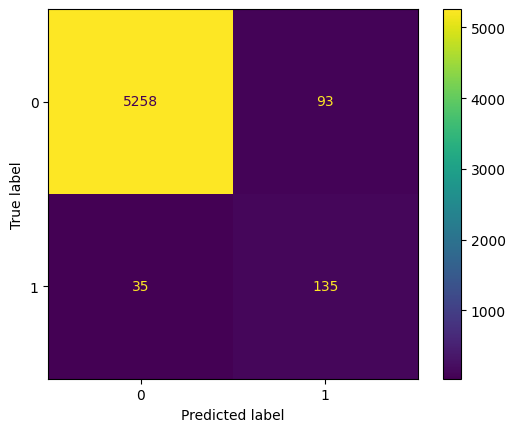

In [149]:
from sklearn.metrics import ConfusionMatrixDisplay
fig=ConfusionMatrixDisplay(confusion_matrix=confusion_matrix(pred_dtc,y_test),display_labels=clf.classes_)
fig.plot()

#### Random forest

In [150]:
from sklearn.ensemble import RandomForestClassifier
rfc = RandomForestClassifier(n_estimators=10,criterion='entropy',random_state=42)
rfc.fit(X_train,y_train)
pred_rfc = rfc.predict(X_test)
print(classification_report(y_test,pred_rfc))
print(confusion_matrix(y_test,pred_rfc))

              precision    recall  f1-score   support

           0       0.98      1.00      0.99      5293
           1       0.84      0.56      0.67       228

    accuracy                           0.98      5521
   macro avg       0.91      0.78      0.83      5521
weighted avg       0.98      0.98      0.98      5521

[[5268   25]
 [ 100  128]]


In [151]:
#find the best tree value
error_rate = []

for i in range(1,40):
    rfc = RandomForestClassifier(n_estimators=i,criterion='entropy',random_state=42)
    rfc.fit(X_train,y_train)
    pred_i = rfc.predict(X_test)
    error_rate.append(np.mean(pred_i != y_test))

Text(0, 0.5, 'Error Rate')

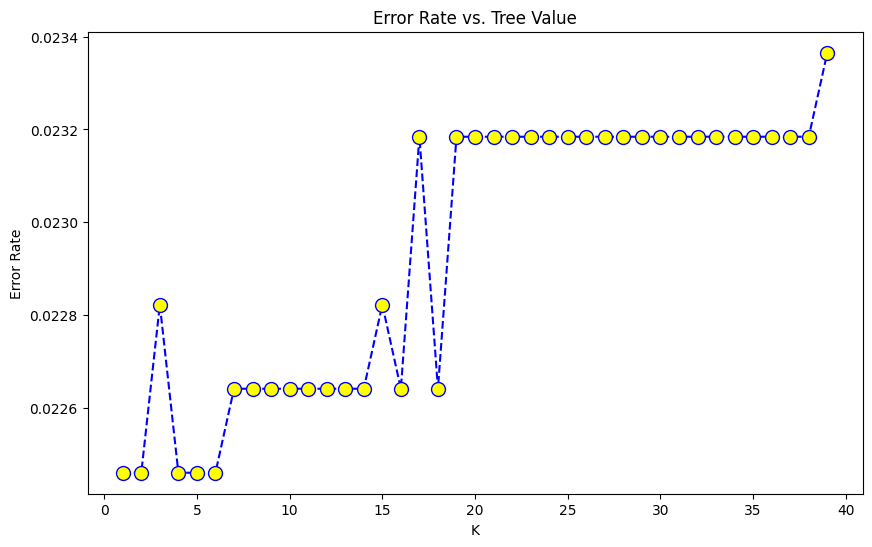

In [152]:
import seaborn as sns
import matplotlib.pyplot as plt

plt.figure(figsize=(10,6))
plt.plot(range(1,40),error_rate,color='blue', linestyle='dashed', marker='o',
         markerfacecolor='yellow', markersize=10)
plt.title('Error Rate vs. Tree Value')
plt.xlabel('K')
plt.ylabel('Error Rate') #error rate decrease as the tree value increases

In [153]:
rfc = RandomForestClassifier(n_estimators=5,criterion='entropy',random_state=42) #12- trees from elbow method
rfc.fit(X_train,y_train)
pred_rfc= rfc.predict(X_test)
print(classification_report(y_test,pred_rfc))
print(confusion_matrix(y_test,pred_rfc))

              precision    recall  f1-score   support

           0       0.98      0.99      0.99      5293
           1       0.83      0.57      0.68       228

    accuracy                           0.98      5521
   macro avg       0.91      0.78      0.83      5521
weighted avg       0.98      0.98      0.98      5521

[[5266   27]
 [  97  131]]


#### Xgboost classifier

In [154]:
from xgboost import XGBClassifier
classifier=XGBClassifier()
classifier.fit(X_train,y_train)
pred_xgb= classifier.predict(X_test)
print(classification_report(y_test,pred_rfc))
print(confusion_matrix(y_test,pred_rfc))

              precision    recall  f1-score   support

           0       0.98      0.99      0.99      5293
           1       0.83      0.57      0.68       228

    accuracy                           0.98      5521
   macro avg       0.91      0.78      0.83      5521
weighted avg       0.98      0.98      0.98      5521

[[5266   27]
 [  97  131]]


In [155]:
from xgboost import XGBClassifier
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import classification_report, confusion_matrix

# Define the XGBoost classifier
classifier = XGBClassifier()

# Define the parameter grid for hyperparameter tuning
param_grid = {
    'n_estimators': [100, 200, 300],
    'max_depth': [3, 5, 7],
    'learning_rate': [0.01, 0.05, 0.1]
}

# Perform grid search cross-validation
grid_search = GridSearchCV(estimator=classifier, param_grid=param_grid, cv=3, scoring='accuracy', verbose=2, n_jobs=-1)

# Fit the grid search to the data
grid_search.fit(X_train, y_train)

# Get the best model
best_classifier = grid_search.best_estimator_

# Make predictions with the best model
pred_xgb = best_classifier.predict(X_test)

# Print classification report and confusion matrix
print("Classification Report:")
print(classification_report(y_test, pred_xgb))
print("Confusion Matrix:")
print(confusion_matrix(y_test, pred_xgb))

# Print the best parameters found
print("Best Parameters:", grid_search.best_params_)


Fitting 3 folds for each of 27 candidates, totalling 81 fits
Classification Report:
              precision    recall  f1-score   support

           0       0.98      1.00      0.99      5293
           1       0.96      0.47      0.63       228

    accuracy                           0.98      5521
   macro avg       0.97      0.73      0.81      5521
weighted avg       0.98      0.98      0.97      5521

Confusion Matrix:
[[5289    4]
 [ 121  107]]
Best Parameters: {'learning_rate': 0.01, 'max_depth': 3, 'n_estimators': 200}


#### Catboost classifier

In [156]:
from catboost import CatBoostClassifier
classifier=CatBoostClassifier()
classifier.fit(X_train,y_train)
pred_xgb= classifier.predict(X_test)
print(classification_report(y_test,pred_rfc))
print(confusion_matrix(y_test,pred_rfc))

Learning rate set to 0.030683
0:	learn: 0.5757953	total: 4.86ms	remaining: 4.86s
1:	learn: 0.4818491	total: 8.95ms	remaining: 4.47s
2:	learn: 0.4068533	total: 12.8ms	remaining: 4.26s
3:	learn: 0.3407467	total: 16.4ms	remaining: 4.09s
4:	learn: 0.2945898	total: 20.1ms	remaining: 3.99s
5:	learn: 0.2458968	total: 23.8ms	remaining: 3.94s
6:	learn: 0.2079766	total: 27.8ms	remaining: 3.94s
7:	learn: 0.1813944	total: 31.8ms	remaining: 3.95s
8:	learn: 0.1527711	total: 36ms	remaining: 3.96s
9:	learn: 0.1291561	total: 39.4ms	remaining: 3.9s
10:	learn: 0.1114613	total: 43.1ms	remaining: 3.87s
11:	learn: 0.0947960	total: 46.7ms	remaining: 3.84s
12:	learn: 0.0826257	total: 50.5ms	remaining: 3.83s
13:	learn: 0.0722770	total: 54.2ms	remaining: 3.82s
14:	learn: 0.0633999	total: 57.9ms	remaining: 3.8s
15:	learn: 0.0541209	total: 61.6ms	remaining: 3.79s
16:	learn: 0.0474465	total: 65.2ms	remaining: 3.77s
17:	learn: 0.0411207	total: 68.8ms	remaining: 3.75s
18:	learn: 0.0367143	total: 72.5ms	remaining: 3.

In [157]:
import pickle
with open('malayalam_mbert_catboost_classifier.sav', 'wb') as f:
    pickle.dump(classifier, f)

In [159]:
import shutil

local_model_path = '/content/sample_data/malayalam_mbert_catboost_classifier.sav'
destination_path = '/content/drive/MyDrive/Capstone/Models/Classifiers/malayalam_mbert_catboost_classifier.sav'

# Copy the file to the destination directory
shutil.copy(local_model_path, destination_path)


'/content/drive/MyDrive/Capstone/Models/Classifiers/malayalam_mbert_catboost_classifier.sav'

In [160]:
from catboost import CatBoostClassifier
from sklearn.model_selection import GridSearchCV, StratifiedKFold
from sklearn.metrics import classification_report, confusion_matrix

# Define the CatBoost classifier
classifier = CatBoostClassifier()

# Define the parameter grid for hyperparameter tuning
param_grid = {
    'iterations': [100, 200],
    'depth': [3, 5],
    'learning_rate': [0.05, 0.1]
}

# Define stratified k-fold cross-validation
cv = StratifiedKFold(n_splits=3, shuffle=True, random_state=42)

# Perform grid search cross-validation with early stopping
grid_search = GridSearchCV(estimator=classifier, param_grid=param_grid, cv=cv, scoring='accuracy', verbose=2, n_jobs=-1)

# Fit the grid search to the data with early stopping
grid_search.fit(X_train, y_train, early_stopping_rounds=10, eval_set=(X_test, y_test), verbose=False)

# Get the best model
best_classifier = grid_search.best_estimator_

# Make predictions with the best model
pred_catboost = best_classifier.predict(X_test)

# Print classification report and confusion matrix
print("Classification Report:")
print(classification_report(y_test, pred_catboost))
print("Confusion Matrix:")
print(confusion_matrix(y_test, pred_catboost))

# Print the best parameters found
print("Best Parameters:", grid_search.best_params_)


Fitting 3 folds for each of 8 candidates, totalling 24 fits
Classification Report:
              precision    recall  f1-score   support

           0       0.98      1.00      0.99      5293
           1       0.96      0.47      0.63       228

    accuracy                           0.98      5521
   macro avg       0.97      0.73      0.81      5521
weighted avg       0.98      0.98      0.97      5521

Confusion Matrix:
[[5289    4]
 [ 121  107]]
Best Parameters: {'depth': 3, 'iterations': 100, 'learning_rate': 0.05}


### Muril Ensemble models for malayalam text

In [72]:
 #get the features vector and their labels (training set)
X_train,y_train=preprocess_dataset(train_df,
                                   model=muril_model,
                                   training=True,
                                   batch_size=128)

Processing Data: 100%|██████████| 101/101 [02:34<00:00,  1.53s/it]


In [73]:
#get the features vector and their labels (testing set)
X_test,y_test=preprocess_dataset(test_df,
                                 model=muril_model,
                                 training=False,
                                 batch_size=128)

Processing Data: 100%|██████████| 44/44 [01:06<00:00,  1.52s/it]


#### SVM

In [74]:
from sklearn.svm import SVC
from sklearn.metrics import classification_report, confusion_matrix
svm_classifier = SVC(kernel='rbf', random_state=42)
svm_classifier.fit(X_train, y_train)
pred_svm = svm_classifier.predict(X_test)
print(classification_report(y_test, pred_svm))
print(confusion_matrix(y_test, pred_svm))

              precision    recall  f1-score   support

           0       0.98      0.99      0.99      5293
           1       0.78      0.58      0.66       228

    accuracy                           0.98      5521
   macro avg       0.88      0.79      0.83      5521
weighted avg       0.97      0.98      0.97      5521

[[5255   38]
 [  96  132]]


#### Decision tree

In [75]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import classification_report,confusion_matrix
clf=DecisionTreeClassifier(criterion='entropy',random_state=42)
clf.fit(X_train,y_train)
pred_dtc=clf.predict(X_test)
print(classification_report(pred_dtc,y_test))
print(confusion_matrix(pred_dtc,y_test))

              precision    recall  f1-score   support

           0       0.99      0.98      0.99      5331
           1       0.62      0.75      0.68       190

    accuracy                           0.98      5521
   macro avg       0.81      0.87      0.83      5521
weighted avg       0.98      0.98      0.98      5521

[[5245   86]
 [  48  142]]


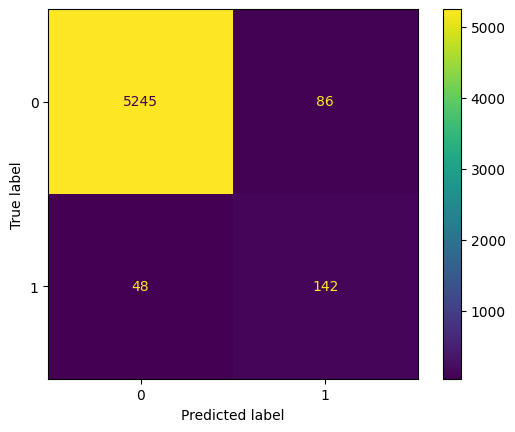

In [76]:
from sklearn.metrics import ConfusionMatrixDisplay
fig=ConfusionMatrixDisplay(confusion_matrix=confusion_matrix(pred_dtc,y_test),display_labels=clf.classes_)
fig.plot()

#### Random forest

In [77]:
from sklearn.ensemble import RandomForestClassifier
rfc = RandomForestClassifier(n_estimators=10,criterion='entropy',random_state=42)
rfc.fit(X_train,y_train)
pred_rfc = rfc.predict(X_test)
print(classification_report(y_test,pred_rfc))
print(confusion_matrix(y_test,pred_rfc))

              precision    recall  f1-score   support

           0       0.98      0.99      0.99      5293
           1       0.76      0.64      0.69       228

    accuracy                           0.98      5521
   macro avg       0.87      0.81      0.84      5521
weighted avg       0.97      0.98      0.98      5521

[[5246   47]
 [  83  145]]


In [78]:
#find the best tree value
error_rate = []

for i in range(1,40):
    rfc = RandomForestClassifier(n_estimators=i,criterion='entropy',random_state=42)
    rfc.fit(X_train,y_train)
    pred_i = rfc.predict(X_test)
    error_rate.append(np.mean(pred_i != y_test))

Text(0, 0.5, 'Error Rate')

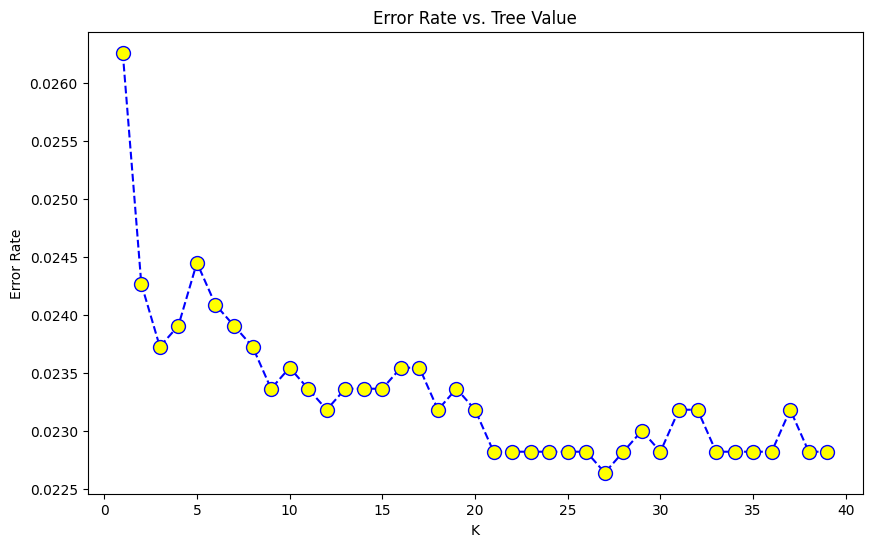

In [79]:
import seaborn as sns
import matplotlib.pyplot as plt

plt.figure(figsize=(10,6))
plt.plot(range(1,40),error_rate,color='blue', linestyle='dashed', marker='o',
         markerfacecolor='yellow', markersize=10)
plt.title('Error Rate vs. Tree Value')
plt.xlabel('K')
plt.ylabel('Error Rate') #error rate decrease as the tree value increases

In [80]:
rfc = RandomForestClassifier(n_estimators=5,criterion='entropy',random_state=42) #12- trees from elbow method
rfc.fit(X_train,y_train)
pred_rfc= rfc.predict(X_test)
print(classification_report(y_test,pred_rfc))
print(confusion_matrix(y_test,pred_rfc))

              precision    recall  f1-score   support

           0       0.98      0.99      0.99      5293
           1       0.74      0.63      0.68       228

    accuracy                           0.98      5521
   macro avg       0.86      0.81      0.83      5521
weighted avg       0.97      0.98      0.97      5521

[[5242   51]
 [  84  144]]


#### Xgboost classifier

In [81]:
from xgboost import XGBClassifier
classifier=XGBClassifier()
classifier.fit(X_train,y_train)
pred_xgb= classifier.predict(X_test)
print(classification_report(y_test,pred_rfc))
print(confusion_matrix(y_test,pred_rfc))

              precision    recall  f1-score   support

           0       0.98      0.99      0.99      5293
           1       0.74      0.63      0.68       228

    accuracy                           0.98      5521
   macro avg       0.86      0.81      0.83      5521
weighted avg       0.97      0.98      0.97      5521

[[5242   51]
 [  84  144]]


In [82]:
from xgboost import XGBClassifier
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import classification_report, confusion_matrix

# Define the XGBoost classifier
classifier = XGBClassifier()

# Define the parameter grid for hyperparameter tuning
param_grid = {
    'n_estimators': [100, 200, 300],
    'max_depth': [3, 5, 7],
    'learning_rate': [0.01, 0.05, 0.1]
}

# Perform grid search cross-validation
grid_search = GridSearchCV(estimator=classifier, param_grid=param_grid, cv=3, scoring='accuracy', verbose=2, n_jobs=-1)

# Fit the grid search to the data
grid_search.fit(X_train, y_train)

# Get the best model
best_classifier = grid_search.best_estimator_

# Make predictions with the best model
pred_xgb = best_classifier.predict(X_test)

# Print classification report and confusion matrix
print("Classification Report:")
print(classification_report(y_test, pred_xgb))
print("Confusion Matrix:")
print(confusion_matrix(y_test, pred_xgb))

# Print the best parameters found
print("Best Parameters:", grid_search.best_params_)


Fitting 3 folds for each of 27 candidates, totalling 81 fits
Classification Report:
              precision    recall  f1-score   support

           0       0.98      0.99      0.99      5293
           1       0.78      0.58      0.66       228

    accuracy                           0.98      5521
   macro avg       0.88      0.79      0.83      5521
weighted avg       0.97      0.98      0.97      5521

Confusion Matrix:
[[5255   38]
 [  96  132]]
Best Parameters: {'learning_rate': 0.01, 'max_depth': 3, 'n_estimators': 100}


#### Catboost classifier

In [83]:
from catboost import CatBoostClassifier
classifier=CatBoostClassifier()
classifier.fit(X_train,y_train)
pred_xgb= classifier.predict(X_test)
print(classification_report(y_test,pred_rfc))
print(confusion_matrix(y_test,pred_rfc))

Learning rate set to 0.030683
0:	learn: 0.6028292	total: 4.76ms	remaining: 4.75s
1:	learn: 0.5244156	total: 8.57ms	remaining: 4.28s
2:	learn: 0.4556310	total: 12.6ms	remaining: 4.18s
3:	learn: 0.3959786	total: 16.3ms	remaining: 4.06s
4:	learn: 0.3482177	total: 19.9ms	remaining: 3.95s
5:	learn: 0.3036766	total: 23.5ms	remaining: 3.89s
6:	learn: 0.2662177	total: 27.6ms	remaining: 3.92s
7:	learn: 0.2361291	total: 31.1ms	remaining: 3.85s
8:	learn: 0.2081645	total: 35.5ms	remaining: 3.91s
9:	learn: 0.1838218	total: 39.1ms	remaining: 3.87s
10:	learn: 0.1636828	total: 42.8ms	remaining: 3.85s
11:	learn: 0.1459386	total: 46.5ms	remaining: 3.83s
12:	learn: 0.1310538	total: 50.1ms	remaining: 3.81s
13:	learn: 0.1181540	total: 54.3ms	remaining: 3.82s
14:	learn: 0.1070209	total: 58.2ms	remaining: 3.83s
15:	learn: 0.0971823	total: 62.2ms	remaining: 3.83s
16:	learn: 0.0887950	total: 65.7ms	remaining: 3.8s
17:	learn: 0.0812358	total: 69.6ms	remaining: 3.8s
18:	learn: 0.0748370	total: 74.5ms	remaining: 

In [84]:
from catboost import CatBoostClassifier
from sklearn.model_selection import GridSearchCV, StratifiedKFold
from sklearn.metrics import classification_report, confusion_matrix

# Define the CatBoost classifier
classifier = CatBoostClassifier()

# Define the parameter grid for hyperparameter tuning
param_grid = {
    'iterations': [100, 200],
    'depth': [3, 5],
    'learning_rate': [0.05, 0.1]
}

# Define stratified k-fold cross-validation
cv = StratifiedKFold(n_splits=3, shuffle=True, random_state=42)

# Perform grid search cross-validation with early stopping
grid_search = GridSearchCV(estimator=classifier, param_grid=param_grid, cv=cv, scoring='accuracy', verbose=2, n_jobs=-1)

# Fit the grid search to the data with early stopping
grid_search.fit(X_train, y_train, early_stopping_rounds=10, eval_set=(X_test, y_test), verbose=False)

# Get the best model
best_classifier = grid_search.best_estimator_

# Make predictions with the best model
pred_catboost = best_classifier.predict(X_test)

# Print classification report and confusion matrix
print("Classification Report:")
print(classification_report(y_test, pred_catboost))
print("Confusion Matrix:")
print(confusion_matrix(y_test, pred_catboost))

# Print the best parameters found
print("Best Parameters:", grid_search.best_params_)


Fitting 3 folds for each of 8 candidates, totalling 24 fits
Classification Report:
              precision    recall  f1-score   support

           0       0.98      0.99      0.99      5293
           1       0.77      0.58      0.66       228

    accuracy                           0.98      5521
   macro avg       0.88      0.79      0.82      5521
weighted avg       0.97      0.98      0.97      5521

Confusion Matrix:
[[5254   39]
 [  96  132]]
Best Parameters: {'depth': 3, 'iterations': 200, 'learning_rate': 0.05}
